<a href="https://colab.research.google.com/github/fazekas-gergo/composer-ai/blob/note-classification/Composer_AI_2_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Composer AI
Authors: Fazekas Gergő and Joseph Tadrous<br>
Used dataset: https://www.kaggle.com/soumikrakshit/classical-music-midi

---
## 1. First steps
At first clone the repository (which also contains the dataset) and install the required packages.

In [2]:
!git clone -l -s https://github.com/fazekas-gergo/composer-ai composer-ai
%cd composer-ai
!pip install midi2audio
!pip install py_midicsv
!pip install pretty_midi
!sudo apt-get install fluidsynth

Cloning into 'composer-ai'...
remote: Enumerating objects: 381, done.
remote: Counting objects: 100% (381/381), done.
remote: Compressing objects: 100% (375/375), done.
remote: Total 381 (delta 30), reused 329 (delta 3), pack-reused 0
Receiving objects: 100% (381/381), 78.79 MiB | 15.95 MiB/s, done.
Resolving deltas: 100% (30/30), done.
/content/composer-ai
     |████████████████████████████████| 96 kB 3.4 MB/s 
  Attempting uninstall: click
    Found existing installation: click 7.1.2
    Uninstalling click-7.1.2:
      Successfully uninstalled click-7.1.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires click<8.0,>=5.1, but you have click 8.1.2 which is incompatible.
     |████████████████████████████████| 5.6 MB 5.2 MB/s 
     |████████████████████████████████| 51 kB 6.7 MB/s 
  Created wheel for pretty-midi: filename=pretty_midi-0.2.9-py

In [3]:
import os
import pretty_midi
import collections
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import music21
from sklearn.preprocessing import MinMaxScaler
from numpy.lib.stride_tricks import sliding_window_view
from datetime import datetime
import subprocess


from midi2audio import FluidSynth
from IPython.display import Audio
from tensorflow import keras
from keras.layers import LSTM, Dense, Dropout, Embedding, Input
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras.initializers import HeNormal

Multiple times used functions

In [4]:
def convert_midi_to_flac(music_path, output='music'):
  FluidSynth('piano.sf2').midi_to_audio(music_path, 'music' + '.flac')
  return 'music' + '.flac'

def play_music(music_path):
  convert_midi_to_flac(music_path, output='music')
  return 'music.flac'



def instrument_to_df(instrument):
    notes = collections.defaultdict(list)
    # Sort the notes by start time
    sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
    prev_start = sorted_notes[0].start
    for note in sorted_notes:
      start = note.start
      end = note.end
      notes['pitch'].append(note.pitch)
      notes['step'].append(start - prev_start)
      notes['duration'].append(end - start)
      prev_start = start
    return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

def midi_file_to_df(midi_file):
  m = pretty_midi.PrettyMIDI(midi_file)
  return pd.concat([instrument_to_df(instrument) for instrument in m.instruments])

def midi_files_to_df(midi_files):
  return pd.concat([midi_file_to_df(f) for f in midi_files])



def tokenize_notes(notes, steps):
  tokenized = np.zeros((len(notes), 108-21))
  for i, note in enumerate(notes):
      tokenized[i, note - 21] = 1
  return tokenized

def get_note_from_token(token):
  return np.argmax(token) + 21

def create_X_Y(df, win_len):
  X = sliding_window_view(df.drop(df.tail(1).index), window_shape=(win_len, df.shape[1]))
  X = X.reshape(X.shape[0], X.shape[2], X.shape[3])
  Y = df.drop(range(win_len), axis='index').values
  return X, Y

def save_and_zip_model(model, name):
  path = "models/" + name + str(datetime.now().strftime("%m-%d-%Y_%H-%M-%S"))
  model.save(path)
  # Zip model to be downloadable
  subprocess.call(['zip', '-r', path + ".zip", path])

---
## 2. Data Familiarization
The *convert_midi_to_flac* function is able to convert the midi file to be listenable by using a soundfont file.

In [5]:
Audio(play_music('classical_music_midi/mozart/mz_331_3.mid'))

The *music21* package lets us to plot the midi file.

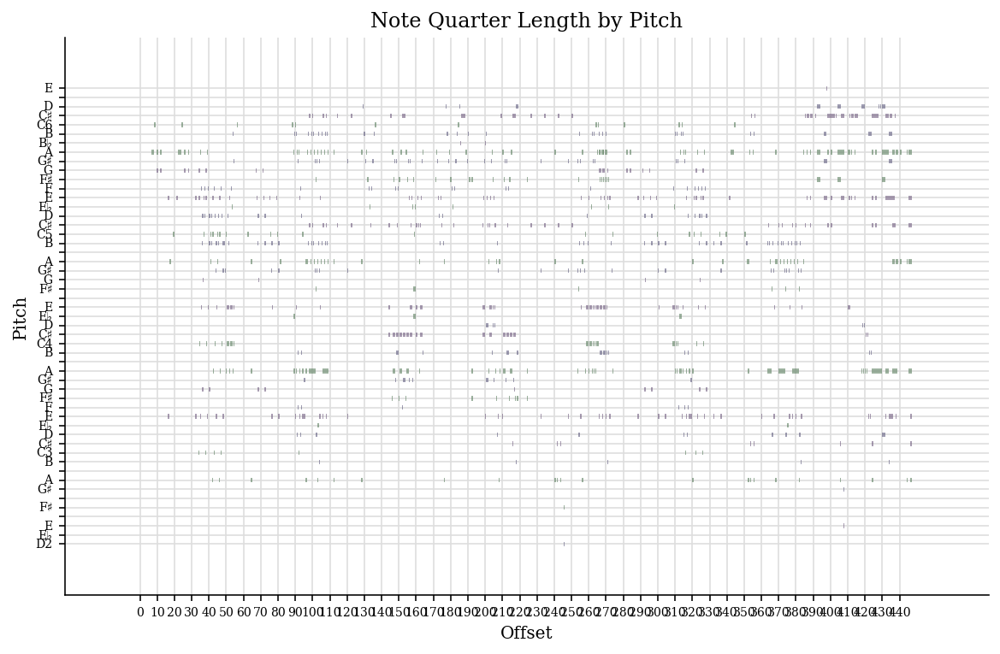

In [6]:
music = music21.converter.parse('classical_music_midi/mozart/mz_331_3.mid')
music.plot()

---
## 3. Data preparation
At first let's create a list, which contains all the midi files from the dataset.

In [7]:
def get_midi_files(main_folder):
  files = []
  for dir in os.listdir(main_folder):
    for file in os.listdir(main_folder + os.path.sep + dir):
      files.append(main_folder + os.path.sep + dir + os.path.sep + file)
  return files

midi_files = get_midi_files('classical_music_midi')
print('Number of read MIDI files:', len(midi_files))

Number of read MIDI files: 295


Secondly, create a pandas data frame filled with the pitches and durations of the notes sorted by the start time.<br>

In [8]:
df = midi_files_to_df(midi_files[0:10])
df.describe()

,pitch,step,duration
count,42953.000000,42953.000000,42953.000000
mean,62.502666,0.187581,0.299349
std,13.251128,0.310956,0.373607
min,27.000000,0.000000,0.004061
25%,53.000000,0.000000,0.107646
50%,63.000000,0.113530,0.159151
75%,72.000000,0.206186,0.357378
max,101.000000,11.258736,5.753328


### Create X, Y matrices for training the note classifier model.

In [9]:
df_tokenized = pd.DataFrame(tokenize_notes(df.pitch, df.step))
df_tokenized.head(1)

,0,1,2,3,4,5,6,7,8,9,...,77,78,79,80,81,82,83,84,85,86
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Window data as well

In [10]:
win_len = 64
X_note, Y_note = create_X_Y(df_tokenized, win_len)
X_note.shape, Y_note.shape

((42889, 64, 87), (42889, 87))

### X, Y matrices for the regressor model

In [11]:
df_filtered = df[(df.step < df.step.quantile(.9)) & (df.duration < df.duration.quantile(.9))]
df_filtered.describe()

,pitch,step,duration
count,35633.000000,35633.000000,35633.000000
mean,63.028429,0.116936,0.191054
std,13.185439,0.108228,0.138140
min,28.000000,0.000000,0.006579
25%,54.000000,0.000000,0.103299
50%,63.000000,0.109633,0.139769
75%,72.000000,0.171428,0.229832
max,101.000000,0.455996,0.707074


In [12]:
s_d_scaler = MinMaxScaler()
s_d_scaler.fit(df_filtered)
scaled = s_d_scaler.transform(df_filtered)
df_scaled = pd.DataFrame(scaled, columns=['pitch','step','duration'])

df_scaled.describe()

,pitch,step,duration
count,35633.000000,35633.000000,35633.000000
mean,0.479841,0.256441,0.263349
std,0.180622,0.237345,0.197204
min,0.000000,0.000000,0.000000
25%,0.356164,0.000000,0.138073
50%,0.479452,0.240425,0.190137
75%,0.602740,0.375943,0.318707
max,1.000000,1.000000,1.000000


In [17]:
X_s_d, Y_s_d = create_X_Y(df_scaled, win_len)
# Remove pitch from Y
Y_s_d = Y_s_d[:, 1:]
X_s_d.shape, Y_s_d.shape

((35569, 64, 3), (35569, 2))



---
# 4. Training
The are two models:
*   **Note classifier**: predicts the next note from the previous note as a classification problem.
*   **Step, duration regressor**: predicts the next step and duration value from the note, step and duration values.

### Note classifier

In [13]:
note_classifier = Sequential(name='note_classifier')
note_classifier.add(LSTM(win_len, input_shape=(X_note.shape[1:]), name='lstm')),
note_classifier.add(Dense(1000, activation='relu', kernel_initializer=HeNormal(), name='dense_1')),
note_classifier.add(Dense(500, activation='relu', kernel_initializer=HeNormal(), name='dense_2')),
note_classifier.add(Dense(200, activation='relu', kernel_initializer=HeNormal(), name='dense_3')),
note_classifier.add(Dense(100, activation='relu', kernel_initializer=HeNormal(), name='dense_4')),
note_classifier.add(Dense(87, activation='softmax', name='output'))

note_classifier.compile(loss=keras.losses.CategoricalCrossentropy(), optimizer=Adam(learning_rate=0.0005), metrics=['accuracy'])
note_classifier.summary()

Model: "note_classifier"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 64)                38912     
                                                                 
 dense_1 (Dense)             (None, 1000)              65000     
                                                                 
 dense_2 (Dense)             (None, 500)               500500    
                                                                 
 dense_3 (Dense)             (None, 200)               100200    
                                                                 
 dense_4 (Dense)             (None, 100)               20100     
                                                                 
 output (Dense)              (None, 87)                8787      
                                                                 
Total params: 733,499
Trainable params: 733,499
Non

In [14]:
es = EarlyStopping(patience=30, monitor='accuracy', restore_best_weights=True, verbose=10)
note_classifier.fit(X_note, Y_note, epochs=500, callbacks=[es], batch_size=1024)

Epoch 1/500
42/42 [==============================] - 8s 43ms/step - loss: 3.8635 - accuracy: 0.0768
Epoch 2/500
42/42 [==============================] - 2s 42ms/step - loss: 2.9908 - accuracy: 0.1566
Epoch 3/500
42/42 [==============================] - 2s 41ms/step - loss: 2.7806 - accuracy: 0.1751
Epoch 4/500
42/42 [==============================] - 2s 42ms/step - loss: 2.6891 - accuracy: 0.1904
Epoch 5/500
42/42 [==============================] - 2s 41ms/step - loss: 2.6306 - accuracy: 0.2014
Epoch 6/500
42/42 [==============================] - 2s 41ms/step - loss: 2.5789 - accuracy: 0.2178
Epoch 7/500
42/42 [==============================] - 2s 41ms/step - loss: 2.5344 - accuracy: 0.2327
Epoch 8/500
42/42 [==============================] - 2s 41ms/step - loss: 2.4880 - accuracy: 0.2480
Epoch 9/500
42/42 [==============================] - 2s 41ms/step - loss: 2.4523 - accuracy: 0.2623
Epoch 10/500
42/42 [==============================] - 2s 41ms/step - loss: 2.4130 - accuracy: 0.2755

Save model

In [15]:
save_and_zip_model(note_classifier, 'note_classifier')

INFO:tensorflow:Assets written to: models/note_classifier04-02-2022_19-53-53/assets


INFO:tensorflow:Assets written to: models/note_classifier04-02-2022_19-53-53/assets


### Step, duration regressor

In [18]:
s_d_regressor = Sequential(name='step_duration_regressor')
s_d_regressor.add(LSTM(win_len, input_shape=(X_s_d.shape[1:]))),
s_d_regressor.add(Dense(win_len*2, activation='relu', kernel_initializer=HeNormal())),
s_d_regressor.add(Dense(win_len, activation='relu', kernel_initializer=HeNormal())),
s_d_regressor.add(Dense(10, activation='relu', kernel_initializer=HeNormal())),
s_d_regressor.add(Dense(2, activation='sigmoid', name='output'))

s_d_regressor.compile(loss=keras.losses.MeanSquaredError(), optimizer=keras.optimizers.Adam(learning_rate=0.001))
s_d_regressor.summary()

Model: "step_duration_regressor"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 64)                17408     
                                                                 
 dense (Dense)               (None, 128)               8320      
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 10)                650       
                                                                 
 output (Dense)              (None, 2)                 22        
                                                                 
Total params: 34,656
Trainable params: 34,656
Non-trainable params: 0
_________________________________________________________________


In [19]:
es = keras.callbacks.EarlyStopping(patience=50, monitor='loss', restore_best_weights=True, verbose=10)
s_d_regressor.fit(X_s_d, Y_s_d, epochs=1000, callbacks=[es], batch_size=2048)

Epoch 1/1000
18/18 [==============================] - 8s 54ms/step - loss: 0.0740
Epoch 2/1000
18/18 [==============================] - 1s 44ms/step - loss: 0.0489
Epoch 3/1000
18/18 [==============================] - 1s 42ms/step - loss: 0.0457
Epoch 4/1000
18/18 [==============================] - 1s 45ms/step - loss: 0.0399
Epoch 5/1000
18/18 [==============================] - 1s 46ms/step - loss: 0.0370
Epoch 6/1000
18/18 [==============================] - 1s 52ms/step - loss: 0.0355
Epoch 7/1000
18/18 [==============================] - 1s 38ms/step - loss: 0.0348
Epoch 8/1000
18/18 [==============================] - 1s 37ms/step - loss: 0.0344
Epoch 9/1000
18/18 [==============================] - 1s 36ms/step - loss: 0.0339
Epoch 10/1000
18/18 [==============================] - 1s 37ms/step - loss: 0.0335
Epoch 11/1000
18/18 [==============================] - 1s 37ms/step - loss: 0.0330
Epoch 12/1000
18/18 [==============================] - 1s 37ms/step - loss: 0.0325
Epoch 13/1000

save model

In [20]:
save_and_zip_model(s_d_regressor, 's_d_regressor')

INFO:tensorflow:Assets written to: models/s_d_regressor04-02-2022_20-05-55/assets


INFO:tensorflow:Assets written to: models/s_d_regressor04-02-2022_20-05-55/assets




---
# Output
Write output into a midi file and listen it


In [ ]:
from tensorflow.keras.models import load_model

note_classifier = load_model()
note_classifier.summary()

In [29]:
num_generate = 1000

In [30]:
def generate_notes(num: int):
  num = num + win_len
  out = np.ones(shape=(num, 87))
  for i in range(num-win_len):
    input = out[i:i+win_len].reshape(win_len, 87)
    new_pred = note_classifier.predict(out[i:i+win_len].reshape(1, win_len, 87)).reshape(87)
    out[i+win_len] = new_pred
  out = out[win_len:]
  return [get_note_from_token(token) for token in out]

generated_notes = generate_notes(num_generate)
print(generated_notes)

[97, 97, 97, 97, 97, 88, 98, 97, 95, 93, 92, 93, 95, 93, 79, 96, 79, 96, 91, 96, 91, 96, 91, 96, 91, 96, 98, 96, 99, 96, 99, 96, 94, 92, 91, 89, 87, 85, 93, 90, 86, 83, 82, 85, 82, 85, 82, 80, 78, 77, 75, 73, 72, 73, 72, 75, 85, 73, 85, 73, 82, 85, 73, 85, 73, 76, 85, 88, 85, 93, 88, 85, 88, 90, 88, 87, 85, 90, 88, 85, 93, 93, 85, 93, 81, 85, 93, 81, 85, 88, 93, 81, 85, 88, 85, 81, 93, 88, 85, 93, 81, 85, 88, 69, 81, 76, 73, 81, 76, 73, 73, 81, 81, 76, 73, 76, 81, 81, 76, 73, 73, 76, 81, 81, 76, 73, 81, 77, 72, 81, 77, 72, 81, 77, 72, 81, 77, 72, 81, 77, 72, 81, 77, 72, 81, 77, 72, 81, 77, 72, 81, 77, 72, 81, 77, 72, 82, 79, 72, 77, 72, 77, 72, 77, 72, 77, 72, 77, 72, 77, 72, 82, 79, 77, 77, 82, 77, 82, 75, 89, 84, 77, 82, 89, 84, 82, 94, 82, 89, 87, 91, 94, 82, 94, 82, 89, 87, 89, 82, 91, 82, 94, 85, 82, 89, 80, 92, 82, 94, 82, 89, 87, 91, 94, 82, 89, 87, 91, 94, 82, 89, 92, 82, 94, 82, 94, 92, 82, 89, 87, 85, 89, 91, 94, 82, 89, 92, 91, 94, 96, 91, 88, 85, 89, 89, 92, 80, 87, 96, 84,

In [31]:
def generate_step_and_duration(num, notes):
  num = num + win_len
  out = np.zeros(shape=(num, 3))

  out[win_len:, 0] = notes
  out = s_d_scaler.transform(out)

  for i in range(num-win_len):
    input = out[i:i+win_len].reshape(win_len, 3)
    new_pred = s_d_regressor.predict(out[i:i+win_len].reshape(1, win_len, 3)).reshape(2)
    out[i+win_len, 1:] = new_pred

  out = out[win_len:]
  return s_d_scaler.inverse_transform(out)[:, 1:]

generated_s_d = generate_step_and_duration(num_generate, generated_notes)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  "X does not have valid feature names, but"


In [36]:
generated_values = np.zeros(shape=(num_generate, 3))
generated_values[:, 0] = generated_notes
generated_values[:, 1:] = generated_s_d

generated_piece = pd.DataFrame(generated_values, columns=['pitch',	'step',	'duration'])
generated_piece

,pitch,step,duration
0,97.0,1.506387e-35,0.437688
1,97.0,1.332864e-30,0.575754
2,97.0,1.240838e-19,0.647453
3,97.0,5.391987e-13,0.540418
4,97.0,1.590226e-06,0.326240
...,...,...,...
995,52.0,2.131743e-01,0.049667
996,53.0,2.128477e-01,0.047502
997,41.0,2.131686e-01,0.047319
998,53.0,2.100692e-01,0.050147


In [37]:
music = pretty_midi.PrettyMIDI()
piano = pretty_midi.Instrument(program=pretty_midi.instrument_name_to_program('Acoustic Grand Piano'))

start = 0
for index, p in generated_piece.iterrows():
  note_number = round(p.pitch)
  note = pretty_midi.Note(velocity=100, pitch=note_number, 
                          start=start, end=start+p.duration)
  piano.notes.append(note)
  start += p.step

# Add the piano instrument to the PrettyMIDI object
music.instruments.append(piano)
# Write out the MIDI data
music.write('output.mid')

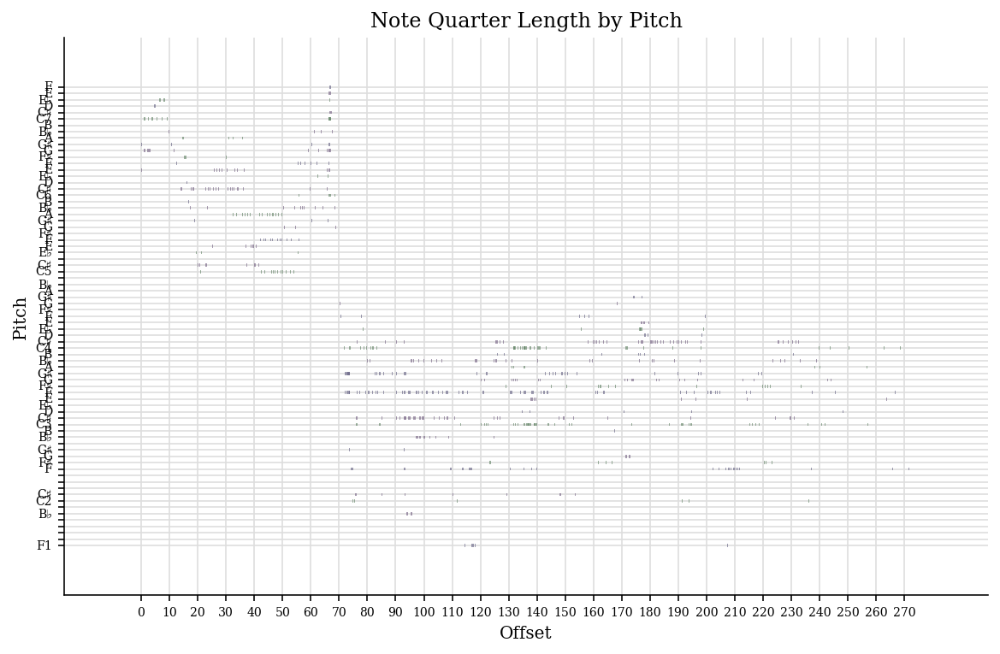

In [38]:
music = music21.converter.parse('output.mid')
music.plot()

In [39]:
Audio(play_music('output.mid'))